In [69]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [70]:
df = pd.read_csv("high_diamond_ranked_10min.csv")

In [71]:
df.head()

,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,...,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
0,4519157822,0,28,2,1,9,6,11,0,0,...,0,16567,6.8,17047,197,55,-643,8,19.7,1656.7
1,4523371949,0,12,1,0,5,5,5,0,0,...,1,17620,6.8,17438,240,52,2908,1173,24.0,1762.0
2,4521474530,0,15,0,0,7,11,4,1,1,...,0,17285,6.8,17254,203,28,1172,1033,20.3,1728.5
3,4524384067,0,43,1,0,4,5,5,1,0,...,0,16478,7.0,17961,235,47,1321,7,23.5,1647.8
4,4436033771,0,75,4,0,6,6,6,0,0,...,0,17404,7.0,18313,225,67,1004,-230,22.5,1740.4


In [72]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9879 entries, 0 to 9878
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   gameId                        9879 non-null   int64  
 1   blueWins                      9879 non-null   int64  
 2   blueWardsPlaced               9879 non-null   int64  
 3   blueWardsDestroyed            9879 non-null   int64  
 4   blueFirstBlood                9879 non-null   int64  
 5   blueKills                     9879 non-null   int64  
 6   blueDeaths                    9879 non-null   int64  
 7   blueAssists                   9879 non-null   int64  
 8   blueEliteMonsters             9879 non-null   int64  
 9   blueDragons                   9879 non-null   int64  
 10  blueHeralds                   9879 non-null   int64  
 11  blueTowersDestroyed           9879 non-null   int64  
 12  blueTotalGold                 9879 non-null   int64  
 13  blu

In [73]:
print(df.columns)


Index(['gameId', 'blueWins', 'blueWardsPlaced', 'blueWardsDestroyed',
       'blueFirstBlood', 'blueKills', 'blueDeaths', 'blueAssists',
       'blueEliteMonsters', 'blueDragons', 'blueHeralds',
       'blueTowersDestroyed', 'blueTotalGold', 'blueAvgLevel',
       'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'blueGoldDiff', 'blueExperienceDiff',
       'blueCSPerMin', 'blueGoldPerMin', 'redWardsPlaced', 'redWardsDestroyed',
       'redFirstBlood', 'redKills', 'redDeaths', 'redAssists',
       'redEliteMonsters', 'redDragons', 'redHeralds', 'redTowersDestroyed',
       'redTotalGold', 'redAvgLevel', 'redTotalExperience',
       'redTotalMinionsKilled', 'redTotalJungleMinionsKilled', 'redGoldDiff',
       'redExperienceDiff', 'redCSPerMin', 'redGoldPerMin'],
      dtype='object')


There are no null/ missing values to be removed

### **EDA**

In [74]:
df1 = df.copy()

Check relationships of Blue Team's features

In [75]:
cols = ['gameId', 'redFirstBlood', 'redKills','redDeaths',
        'redGoldDiff', 'redExperienceDiff']
df1 = df1.drop(cols, axis = 1)

In [76]:
print(df1.columns)

Index(['blueWins', 'blueWardsPlaced', 'blueWardsDestroyed', 'blueFirstBlood',
       'blueKills', 'blueDeaths', 'blueAssists', 'blueEliteMonsters',
       'blueDragons', 'blueHeralds', 'blueTowersDestroyed', 'blueTotalGold',
       'blueAvgLevel', 'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'blueGoldDiff', 'blueExperienceDiff',
       'blueCSPerMin', 'blueGoldPerMin', 'redWardsPlaced', 'redWardsDestroyed',
       'redAssists', 'redEliteMonsters', 'redDragons', 'redHeralds',
       'redTowersDestroyed', 'redTotalGold', 'redAvgLevel',
       'redTotalExperience', 'redTotalMinionsKilled',
       'redTotalJungleMinionsKilled', 'redCSPerMin', 'redGoldPerMin'],
      dtype='object')


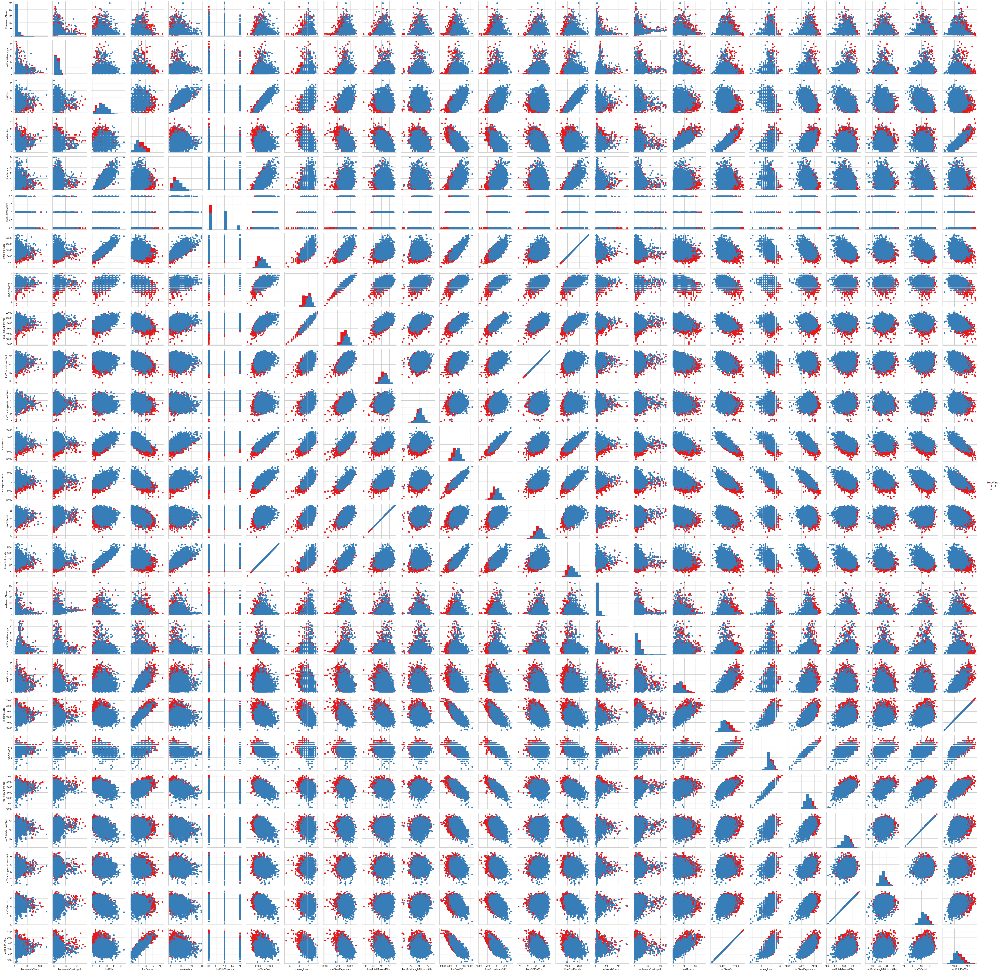

In [77]:
g = sns.PairGrid(data=df1, vars=['blueWardsPlaced', 'blueWardsDestroyed', 
       'blueKills', 'blueDeaths', 'blueAssists', 'blueEliteMonsters',
       'blueTotalGold',
       'blueAvgLevel', 'blueTotalExperience', 'blueTotalMinionsKilled',
       'blueTotalJungleMinionsKilled', 'blueGoldDiff', 'blueExperienceDiff',
       'blueCSPerMin', 'blueGoldPerMin', 'redWardsPlaced', 'redWardsDestroyed',
       'redAssists', 'redTotalGold', 'redAvgLevel',
       'redTotalExperience', 'redTotalMinionsKilled',
       'redTotalJungleMinionsKilled', 'redCSPerMin', 'redGoldPerMin'], hue='blueWins', palette='Set1')
g.map_diag(plt.hist)
g.map_offdiag(plt.scatter)
g.add_legend();

Check Collinearity of Blue Team features

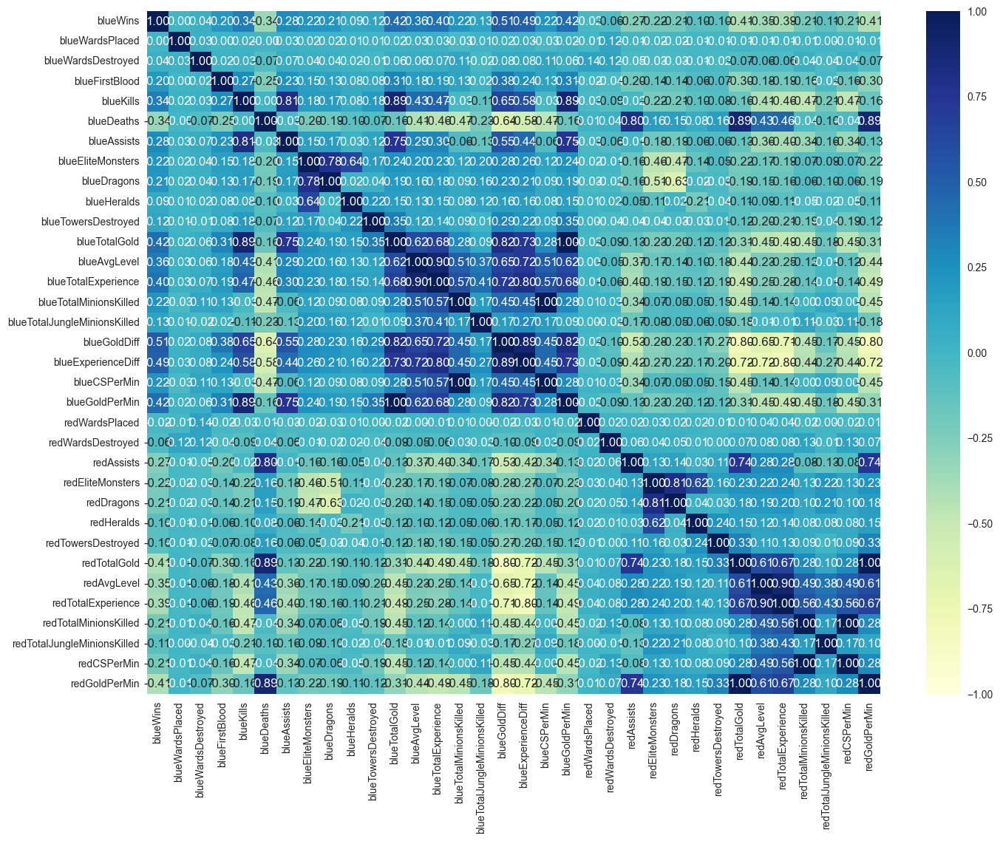

In [78]:
plt.figure(figsize=(16, 12))
sns.heatmap(df1.corr(), cmap='YlGnBu', annot=True, fmt='.2f', vmin=-1);

Clean the dataset based on the collinearity

In [79]:
corr = df1.corr()
high_corr_columns = []

for i, column in enumerate(corr.columns):
    for j, row in enumerate(corr.columns):
        if i < j and abs(corr.at[row, column]) >= 0.8:
            high_corr_columns.append((column, row))

print(high_corr_columns)

[('blueKills', 'blueAssists'), ('blueKills', 'blueTotalGold'), ('blueKills', 'blueGoldPerMin'), ('blueDeaths', 'redAssists'), ('blueDeaths', 'redTotalGold'), ('blueDeaths', 'redGoldPerMin'), ('blueTotalGold', 'blueGoldDiff'), ('blueTotalGold', 'blueGoldPerMin'), ('blueAvgLevel', 'blueTotalExperience'), ('blueTotalExperience', 'blueExperienceDiff'), ('blueTotalMinionsKilled', 'blueCSPerMin'), ('blueGoldDiff', 'blueExperienceDiff'), ('blueGoldDiff', 'blueGoldPerMin'), ('blueGoldDiff', 'redTotalGold'), ('blueGoldDiff', 'redGoldPerMin'), ('blueExperienceDiff', 'redTotalExperience'), ('redEliteMonsters', 'redDragons'), ('redTotalGold', 'redGoldPerMin'), ('redAvgLevel', 'redTotalExperience'), ('redTotalMinionsKilled', 'redCSPerMin')]


In [80]:
cols = ['blueWins', 'blueWardsPlaced', 'blueWardsDestroyed', 'blueFirstBlood', 'blueAssists', 'blueEliteMonsters'
        , 'blueHeralds', 'blueTowersDestroyed', 'blueTotalExperience', 'blueTotalJungleMinionsKilled',
'blueCSPerMin', 'blueGoldPerMin', 'redWardsPlaced', 'redWardsDestroyed',
'redAssists', 'redEliteMonsters', 'redHeralds',
'redTowersDestroyed', 'redTotalExperience', 'redTotalJungleMinionsKilled', 'redCSPerMin', 'redGoldPerMin']
df1 = df1[cols]

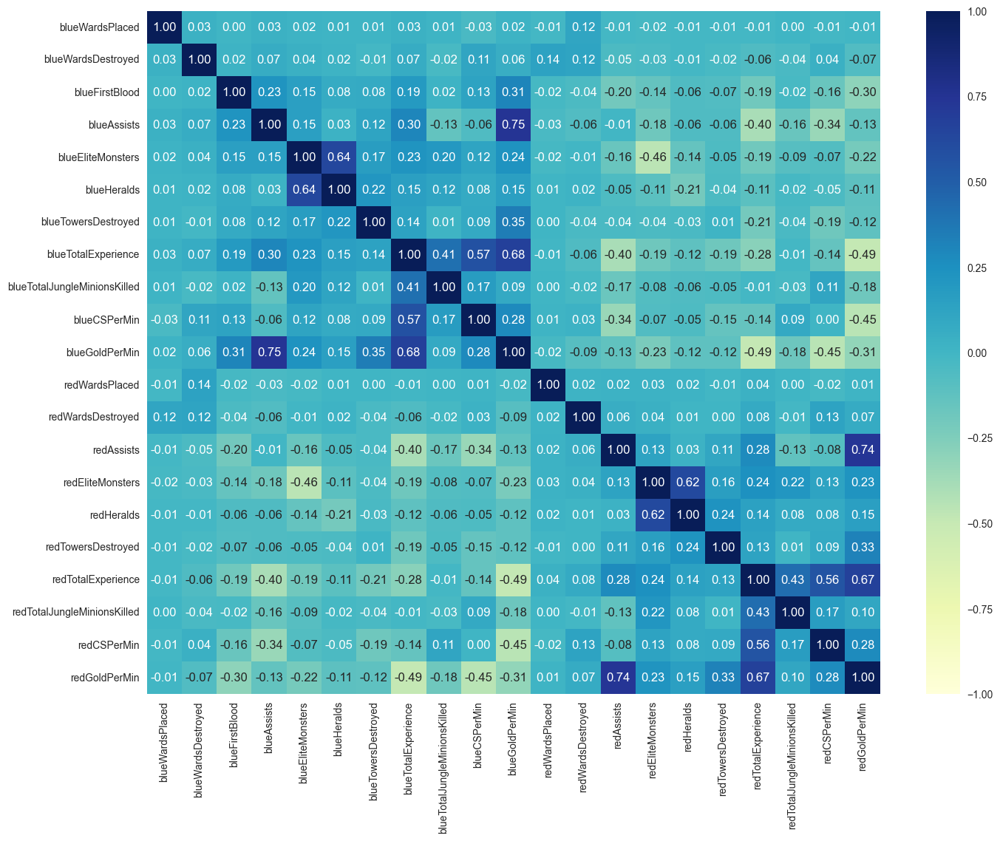

In [81]:
plt.figure(figsize=(16, 12))
sns.heatmap(df1.drop('blueWins', axis=1).corr(), cmap='YlGnBu', annot=True, fmt='.2f', vmin=-1);

Create a histogram of of cleaned, new dataframe

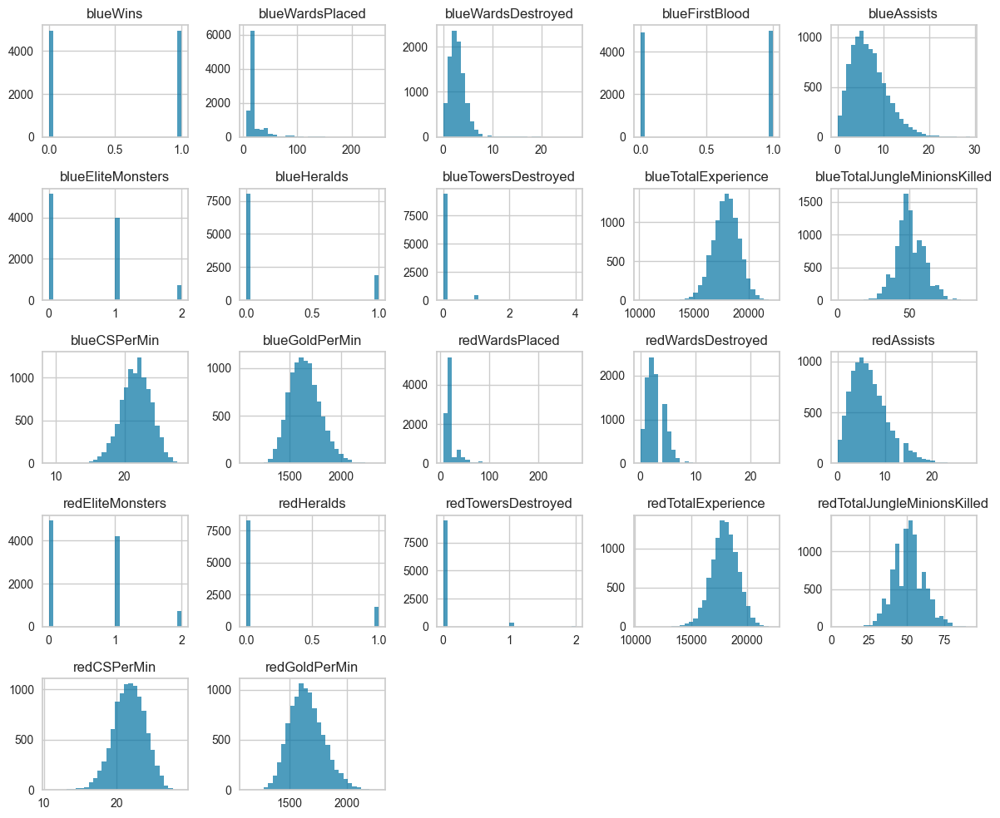

In [82]:
df1.hist(alpha = 0.7, figsize=(12,10), bins=30)
plt.tight_layout()

### **Feature Engineering**

In [83]:
df1['blueHelpful'] = np.where(df['blueKills'] != 0, df['blueAssists'] / df['blueKills'], 0)
df1['redHelpful'] = np.where(df['blueDeaths'] != 0, df['redAssists'] / df['blueDeaths'], 0)

df1['blueJunglePercentage'] = df['blueTotalJungleMinionsKilled'] / df['blueTotalMinionsKilled']
df1['redJunglePercentage'] = df['redTotalJungleMinionsKilled'] / df['redTotalMinionsKilled']

df1['redWardsRemaining'] = df['redWardsPlaced'] - df['blueWardsDestroyed']
df1['blueWardsRemaining'] = df['blueWardsPlaced'] - df['redWardsDestroyed']

C:\Users\Park\AppData\Local\Temp\ipykernel_20772\506726123.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['blueHelpful'] = np.where(df['blueKills'] != 0, df['blueAssists'] / df['blueKills'], 0)
C:\Users\Park\AppData\Local\Temp\ipykernel_20772\506726123.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['redHelpful'] = np.where(df['blueDeaths'] != 0, df['redAssists'] / df['blueDeaths'], 0)
C:\Users\Park\AppData\Local\Temp\ipykernel_20772\506726123.py:4: SettingWithCopyWarning: 
A value is tryin

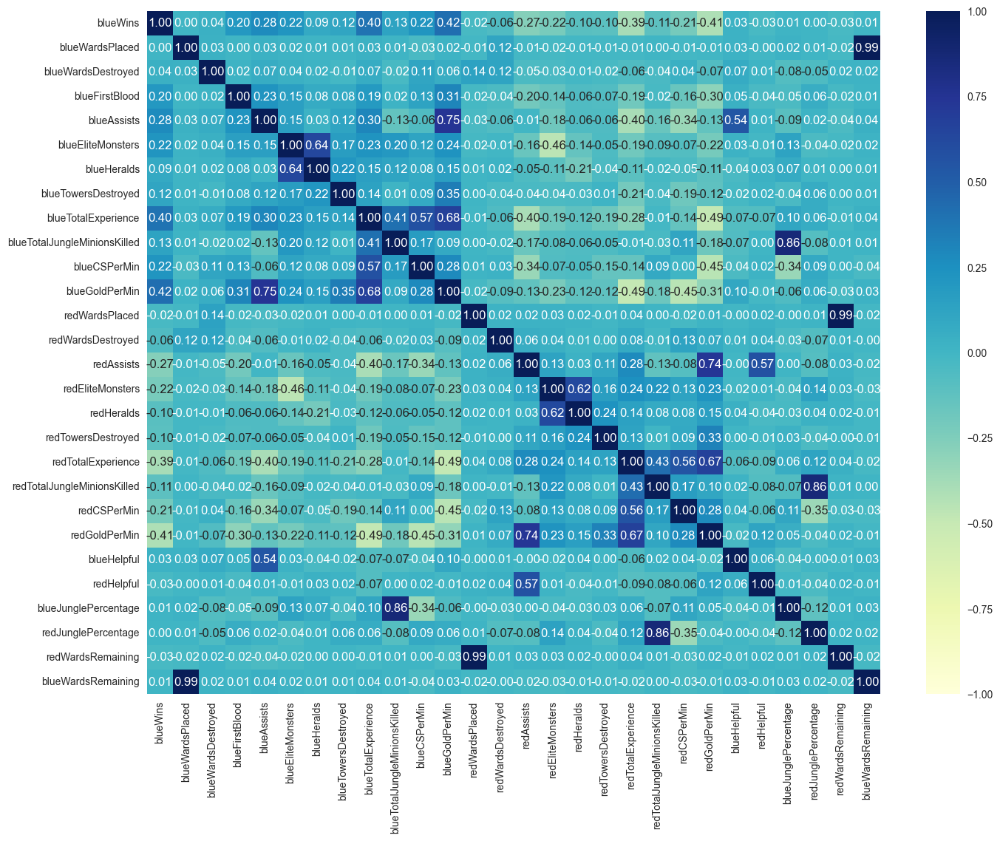

In [84]:
plt.figure(figsize=(16, 12))
sns.heatmap(df1.corr(), cmap='YlGnBu', annot=True, fmt='.2f', vmin=-1);

In [85]:
corr = df1.corr()
high_corr_columns = []

for i, column in enumerate(corr.columns):
    for j, row in enumerate(corr.columns):
        if i < j and abs(corr.at[row, column]) >= 0.8:
            high_corr_columns.append((column, row))
        if i < j and abs(corr.at[row, column]) <= -0.8:
            high_corr_columns.append((column, row))

print(high_corr_columns)

[('blueWardsPlaced', 'blueWardsRemaining'), ('blueTotalJungleMinionsKilled', 'blueJunglePercentage'), ('redWardsPlaced', 'redWardsRemaining'), ('redTotalJungleMinionsKilled', 'redJunglePercentage')]


In [86]:
df1 = df1.drop(['blueWardsPlaced', 'redWardsPlaced','blueTotalJungleMinionsKilled','redTotalJungleMinionsKilled'], axis=1)


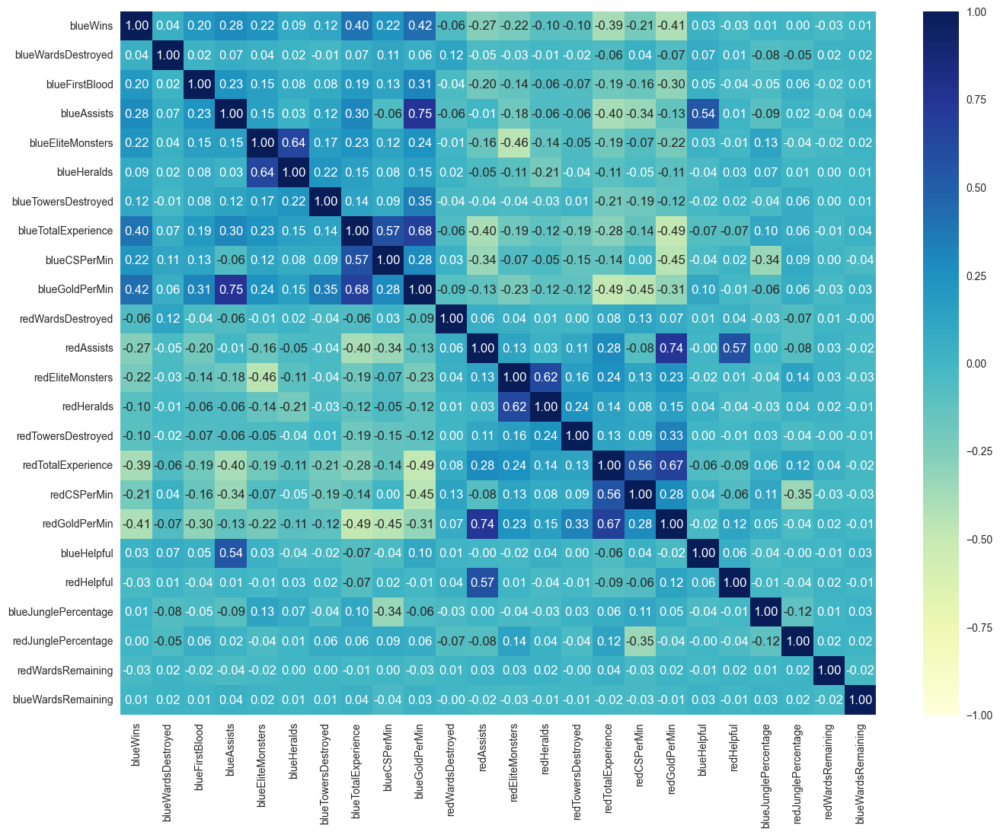

In [87]:
plt.figure(figsize=(16, 12))
sns.heatmap(df1.corr(), cmap='YlGnBu', annot=True, fmt='.2f', vmin=-1);

### **Train Test Split**

In [88]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

X = df1.drop('blueWins', axis=1)
y = df1['blueWins']
scaler = MinMaxScaler()
scaler.fit(X)
X = scaler.transform(X)

X_train, X_val_test, y_train, y_val_test = train_test_split(
    X, y, test_size=0.3, random_state=42)

X_val, X_test, y_val, y_test = train_test_split(
    X_val_test, y_val_test, test_size=0.5, random_state=42)


In [89]:
X.shape

(9879, 23)

### **Logistic Regression**

In [90]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression

param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100], 
    'penalty': [None, 'l2'],
}

log_reg = LogisticRegression()
grid_search = GridSearchCV(estimator=log_reg, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1)

grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)

best_model_log = grid_search.best_estimator_
y_pred_log = best_model_log.predict(X_test)

acc_reg = accuracy_score(y_test, y_pred_log)

print("Accuracy on test set: ", acc_reg)
print("Classification Report:\n", classification_report(y_test, y_pred_log))

Fitting 5 folds for each of 12 candidates, totalling 60 fits


c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\linear_model\_logistic.py:1186: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\linear_model\_logistic.py:1186: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\linear_model\_logistic.py:1186: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\linear_model\_logistic.py:1186: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\linear_model\_logistic.py:1186: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\linear_model\_logistic.py:1186: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\linear_model\_logistic.py:1186: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\linear_model\_logistic.py:1186: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\linear_model\_logistic.py:1186: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\linear_model\_logistic.py:1186: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
c:\Users\Park\anaconda3\envs\MLprod

Best parameters found:  {'C': 1, 'penalty': 'l2'}
Accuracy on test set:  0.7246963562753036
Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.74      0.73       753
           1       0.72      0.71      0.72       729

    accuracy                           0.72      1482
   macro avg       0.72      0.72      0.72      1482
weighted avg       0.72      0.72      0.72      1482



C:\Users\Park\AppData\Local\Temp\ipykernel_20772\1277751362.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importance, y=feature_importance.index, palette=bar_colors)


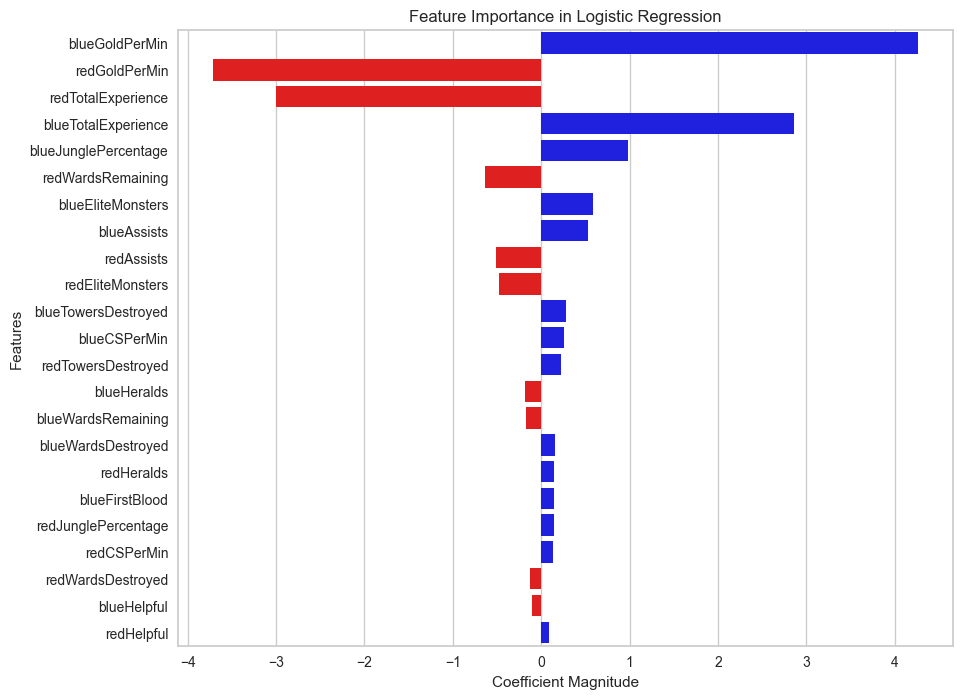

In [91]:

coefficients = best_model_log.coef_[0]
feature_names = df1.drop('blueWins', axis=1).columns
feature_importance = pd.Series(coefficients, index=feature_names).sort_values(key=abs, ascending=False)
plt.figure(figsize=(10, 8))
bar_colors = ['red' if x < 0 else 'blue' for x in feature_importance]
sns.barplot(x=feature_importance, y=feature_importance.index, palette=bar_colors)

plt.title('Feature Importance in Logistic Regression')
plt.xlabel('Coefficient Magnitude')
plt.ylabel('Features')
plt.show()

In [92]:
from sklearn.linear_model import LassoCV
lasso = LassoCV(cv=5, random_state=42, max_iter=10000)
lasso.fit(X, y)
lasso.alpha_

7.149724148578731e-05

In [93]:
selected_features = np.where(lasso.coef_ != 0)[0]

In [94]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression

param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100], 
    'penalty': [None, 'l2'],
}

log_reg = LogisticRegression()
grid_search = GridSearchCV(estimator=log_reg, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1)

grid_search.fit(X_train[:, selected_features], y_train)

print("Best parameters found: ", grid_search.best_params_)

best_model_log_fs = grid_search.best_estimator_
y_pred = best_model_log_fs.predict(X_test[:, selected_features])

acc_reg_fs = accuracy_score(y_test, y_pred)

print("Accuracy on test set: ", acc_reg_fs)
print("Classification Report:\n", classification_report(y_test, y_pred))

Fitting 5 folds for each of 12 candidates, totalling 60 fits


c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\linear_model\_logistic.py:1186: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\linear_model\_logistic.py:1186: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\linear_model\_logistic.py:1186: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\linear_model\_logistic.py:1186: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\linear_model\_logistic.py:1186: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
c:\Users\Park\anaconda3\envs\MLprod

Best parameters found:  {'C': 100, 'penalty': 'l2'}
Accuracy on test set:  0.7240215924426451
Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.73      0.73       753
           1       0.72      0.71      0.72       729

    accuracy                           0.72      1482
   macro avg       0.72      0.72      0.72      1482
weighted avg       0.72      0.72      0.72      1482



### **Random Forest**

In [95]:
# fit the decision tree model
from sklearn import tree

tree = tree.DecisionTreeClassifier()

# search the best params
grid = {'min_samples_split': [5, 10, 20, 50, 100]}

clf_tree = GridSearchCV(tree, grid, cv=5)
clf_tree.fit(X_train, y_train)

pred_tree = clf_tree.predict(X_test)

# get the accuracy score
acc_tree = accuracy_score(pred_tree, y_test)
print(acc_tree)

0.6761133603238867


In [96]:
feature_names = df1.columns
class_names = ['Lose', 'Win']

print("Feature names:", list(feature_names))
print("Class names:", list(class_names))

Feature names: ['blueWins', 'blueWardsDestroyed', 'blueFirstBlood', 'blueAssists', 'blueEliteMonsters', 'blueHeralds', 'blueTowersDestroyed', 'blueTotalExperience', 'blueCSPerMin', 'blueGoldPerMin', 'redWardsDestroyed', 'redAssists', 'redEliteMonsters', 'redHeralds', 'redTowersDestroyed', 'redTotalExperience', 'redCSPerMin', 'redGoldPerMin', 'blueHelpful', 'redHelpful', 'blueJunglePercentage', 'redJunglePercentage', 'redWardsRemaining', 'blueWardsRemaining']
Class names: ['Lose', 'Win']


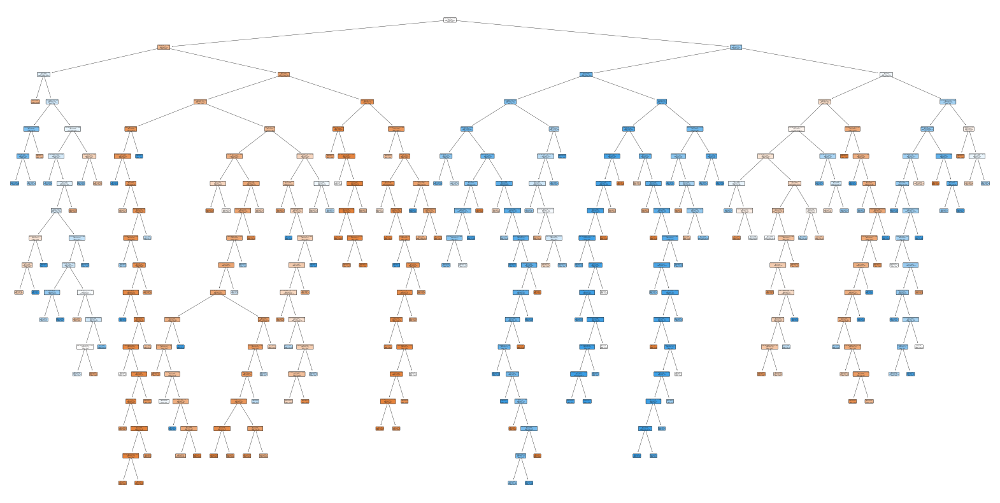

In [97]:
from sklearn.tree import plot_tree

# Extract the best estimator
best_tree = clf_tree.best_estimator_

# plot the best decision tree
plt.figure(figsize=(20,10))
plot_tree(best_tree, filled=True, rounded=True, feature_names=feature_names, class_names=class_names)
plt.show()

Simplify the Decision Tree

In [98]:
from sklearn import tree
tree1 = tree.DecisionTreeClassifier()

# search the best params
grid = {'min_samples_split': [5]}

clf_tree1 = GridSearchCV(tree1, grid, cv=5)
clf_tree1.fit(X_train, y_train)

pred_tree1 = clf_tree1.predict(X_test)

# get the accuracy score
acc_tree1 = accuracy_score(pred_tree, y_test)
print(acc_tree1)

0.6761133603238867


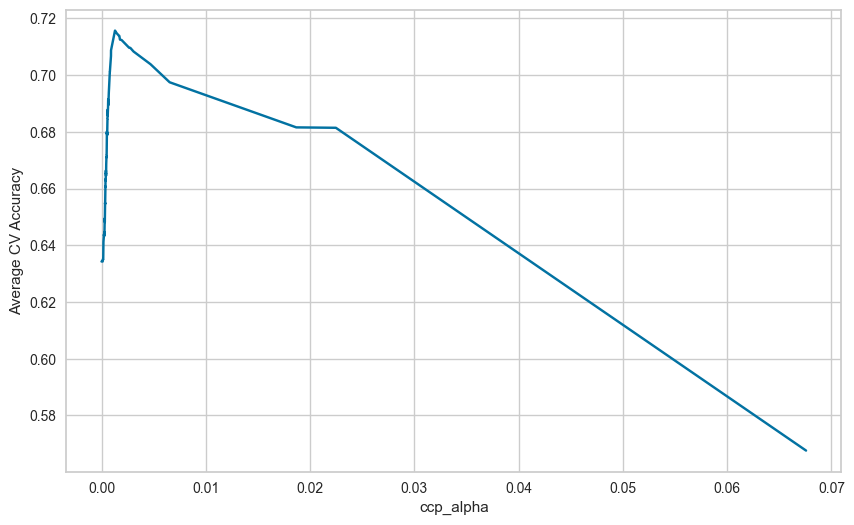

Optimal ccp_alpha: 0.00129417346066929


DecisionTreeClassifier(ccp_alpha=0.00129417346066929, random_state=42)

In [99]:
from sklearn.model_selection import cross_val_score
import numpy as np
from sklearn.tree import DecisionTreeClassifier

clf = tree.DecisionTreeClassifier(random_state=42)
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

# Evaluate the effect of ccp_alpha on cross-validation accuracy
accuracy_scores = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    scores = cross_val_score(clf, X_train, y_train, cv=5)
    accuracy_scores.append(np.mean(scores))

# Plot the accuracy scores against ccp_alpha values
plt.figure(figsize=(10, 6))
plt.plot(ccp_alphas, accuracy_scores)
plt.xlabel('ccp_alpha')
plt.ylabel('Average CV Accuracy')
plt.show()

# Select the ccp_alpha that maximizes accuracy
optimal_ccp_alpha = ccp_alphas[np.argmax(accuracy_scores)]
print('Optimal ccp_alpha:', optimal_ccp_alpha)

# Rebuild the tree using the optimal ccp_alpha
clf = DecisionTreeClassifier(random_state=42, ccp_alpha=optimal_ccp_alpha)
clf.fit(X_train, y_train)


In [100]:
clf = DecisionTreeClassifier(random_state=42, ccp_alpha=optimal_ccp_alpha)
clf.fit(X_train, y_train)

pred_tree2 = clf.predict(X_test)

# get the accuracy score
acc_tree2 = accuracy_score(pred_tree2, y_test)
print(acc_tree2)

0.7010796221322537


### **Random Forest**

In [101]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()

# search the best params
grid = {'n_estimators':[100,200,300,400,500], 'max_depth': [2, 5, 10]}

clf_rf = GridSearchCV(rf, grid, cv=5)
clf_rf.fit(X_train, y_train)

pred_rf = clf_rf.predict(X_test)
# get the accuracy score
acc_rf = accuracy_score(pred_rf, y_test)
print(acc_rf)

0.7078272604588394


In [102]:
from sklearn.metrics import confusion_matrix

# Generate the confusion matrix
conf_matrix = confusion_matrix(y_test, pred_rf)

# Print the confusion matrix
print(conf_matrix)

[[538 215]
 [218 511]]


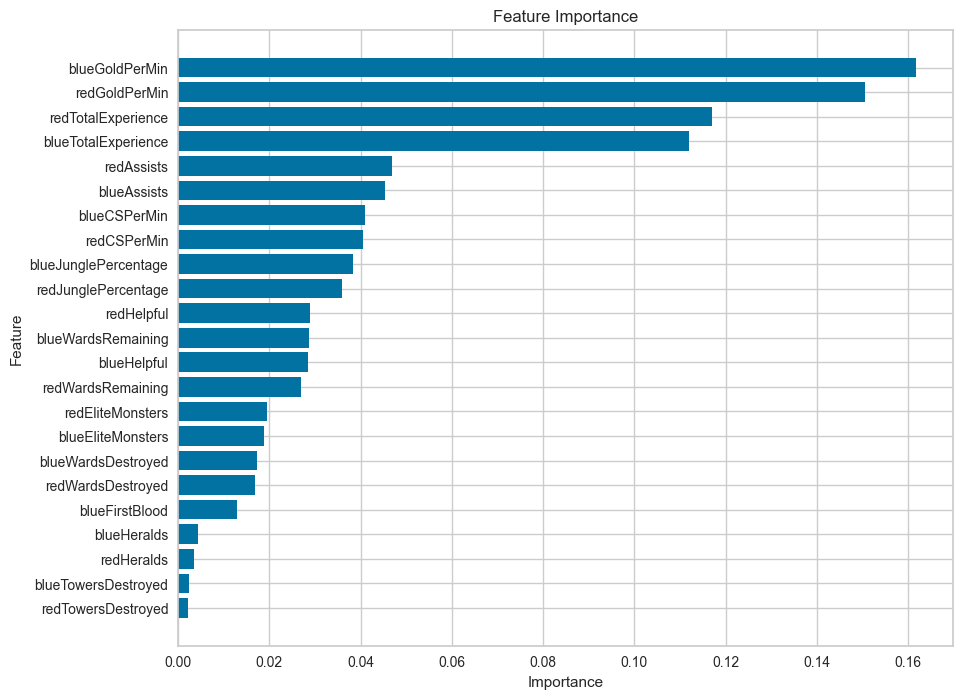

In [103]:
best_rf = clf_rf.best_estimator_

feature_importances = best_rf.feature_importances_
feature_names = df1.drop('blueWins', axis=1).columns.tolist()

features_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})

# Sort the DataFrame by the importances to make the plot more informative
features_df = features_df.sort_values(by='Importance', ascending=True)

# Plotting
plt.figure(figsize=(10, 8))
plt.barh(features_df['Feature'], features_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()

In [104]:
threshold = np.percentile(features_df['Importance'], 75)  # For example, keep top 25% features

selected_features_df = features_df[features_df['Importance'] >= threshold]

print("Selected Features based on the top 25% importance threshold:")
print(selected_features_df)

selected_features_rf = selected_features_df['Feature'].tolist()
print("\nList of selected feature names:", selected_features_rf)

feature_names = df1.drop('blueWins', axis=1).columns.tolist()
X_train_df = pd.DataFrame(X_train, columns=feature_names)
X_test_df = pd.DataFrame(X_test, columns=feature_names)
selected_features_rf = ['blueAssists', 'redAssists', 'redTotalExperience', 'blueTotalExperience', 'redGoldPerMin', 'blueGoldPerMin']

X_train_selected = X_train_df[selected_features_rf]
X_test_selected = X_test_df[selected_features_rf]

rf_selected = RandomForestClassifier(random_state=42)
grid = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [2, 5, 10],
}

# Initialize GridSearchCV
clf_rf_selected = GridSearchCV(estimator=rf_selected, param_grid=grid, cv=5, scoring='accuracy', verbose=1)

# Fit GridSearchCV using only the selected features
clf_rf_selected.fit(X_train_selected, y_train)

# Predict using the best model
pred_rf_selected = clf_rf_selected.predict(X_test_selected)

# Get the accuracy score
acc_rf_selected = accuracy_score(y_test, pred_rf_selected)
print("Accuracy with selected features: ", acc_rf_selected)

# Display the best parameters
print("Best parameters found: ", clf_rf_selected.best_params_)

# Generate and print the confusion matrix
conf_matrix_selected = confusion_matrix(y_test, pred_rf_selected)
print("Confusion Matrix with selected features:\n", conf_matrix_selected)

Selected Features based on the top 25% importance threshold:
                Feature  Importance
2           blueAssists    0.045278
10           redAssists    0.046791
6   blueTotalExperience    0.112083
14   redTotalExperience    0.117093
16        redGoldPerMin    0.150455
8        blueGoldPerMin    0.161752

List of selected feature names: ['blueAssists', 'redAssists', 'blueTotalExperience', 'redTotalExperience', 'redGoldPerMin', 'blueGoldPerMin']
Fitting 5 folds for each of 15 candidates, totalling 75 fits
Accuracy with selected features:  0.713225371120108
Best parameters found:  {'max_depth': 5, 'n_estimators': 500}
Confusion Matrix with selected features:
 [[547 206]
 [219 510]]


### **LightGBM** 

In [105]:
import lightgbm as lgb

param_grid = {
    'num_leaves': [31, 50, 100], 
    'learning_rate': [0.01, 0.1, 0.5], 
    'n_estimators': [100, 200, 500],
    'max_depth': [-1, 5, 10],
}

lgbm = lgb.LGBMClassifier(boosting_type='gbdt', objective='binary', random_state=42)

grid_search = GridSearchCV(estimator=lgbm, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)

best_model_gbm = grid_search.best_estimator_
y_pred = best_model_gbm.predict(X_test)

acc_gbm = accuracy_score(y_test, y_pred)

print("Accuracy on test set: ", acc_gbm)
print("Classification Report:\n", classification_report(y_test, y_pred))

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 3446, number of negative: 3469
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2342
[LightGBM] [Info] Number of data points in the train set: 6915, number of used features: 23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.498337 -> initscore=-0.006652
[LightGBM] [Info] Start training from score -0.006652
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

In [106]:
'''
Best parameters found:  {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'num_leaves': 31}
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Accuracy on test set:  0.7105263157894737
Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.73      0.72       753
           1       0.71      0.69      0.70       729

    accuracy                           0.71      1482
   macro avg       0.71      0.71      0.71      1482
weighted avg       0.71      0.71      0.71      1482

'''

"\nBest parameters found:  {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'num_leaves': 31}\n[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).\nAccuracy on test set:  0.7105263157894737\nClassification Report:\n               precision    recall  f1-score   support\n\n           0       0.71      0.73      0.72       753\n           1       0.71      0.69      0.70       729\n\n    accuracy                           0.71      1482\n   macro avg       0.71      0.71      0.71      1482\nweighted avg       0.71      0.71      0.71      1482\n\n"

### **XGBoost** 

In [107]:
import xgboost as xgb

param_grid = {
    'max_depth': [3, 6, 10], 
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
}

xgb_clf = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss')

grid_search = GridSearchCV(xgb_clf, param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)

best_model_xgb = grid_search.best_estimator_
y_pred = best_model_xgb.predict(X_test)

acc_xgb = accuracy_score(y_test, y_pred)

print("Accuracy on test set: ", acc_xgb)
print("Classification Report:\n", classification_report(y_test, y_pred))

Fitting 5 folds for each of 108 candidates, totalling 540 fits


Best parameters found:  {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 300, 'subsample': 0.8}
Accuracy on test set:  0.7199730094466936
Classification Report:
               precision    recall  f1-score   support

           0       0.72      0.73      0.73       753
           1       0.72      0.71      0.71       729

    accuracy                           0.72      1482
   macro avg       0.72      0.72      0.72      1482
weighted avg       0.72      0.72      0.72      1482



### **GradientBoostingClassifier**

In [108]:
from sklearn.ensemble import GradientBoostingClassifier

param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300], 
    'max_depth': [3, 5, 7], 
    'min_samples_split': [2, 4],  
    'min_samples_leaf': [1, 2],
}
gb_clf = GradientBoostingClassifier(random_state=42)
grid_search = GridSearchCV(estimator=gb_clf, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)
grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)

best_model_gb = grid_search.best_estimator_
y_pred = best_model_gb.predict(X_test)

acc_gb = accuracy_score(y_test, y_pred)

print("Accuracy on test set: ", acc_gb)
print("Classification Report:\n", classification_report(y_test, y_pred))

Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best parameters found:  {'learning_rate': 0.01, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}
Accuracy on test set:  0.7145748987854251
Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.73      0.72       753
           1       0.71      0.70      0.71       729

    accuracy                           0.71      1482
   macro avg       0.71      0.71      0.71      1482
weighted avg       0.71      0.71      0.71      1482



## Model Performance Comparison

In [109]:
# Define the model names and their corresponding accuracy scores or other performance metrics
model_names = ['Logistic Regression', 'Decision Tree', 'Decision Tree (Simplified)', 'Decision Tree (Optimized)', 'Random Forest', 
               'LightGBM', 'XGBoost', 'Gradient Boosting']
accuracy_scores = [acc_reg, acc_tree, acc_tree1, acc_tree2, 
                   acc_rf, acc_gbm, acc_xgb, acc_gb]

# Create a DataFrame to store the model names and accuracy scores
performance_df = pd.DataFrame({'Model': model_names, 'Accuracy Score': accuracy_scores})

# Display the DataFrame
print(performance_df)

                        Model  Accuracy Score
0         Logistic Regression        0.724696
1               Decision Tree        0.676113
2  Decision Tree (Simplified)        0.676113
3   Decision Tree (Optimized)        0.701080
4               Random Forest        0.707827
5                    LightGBM        0.711201
6                     XGBoost        0.719973
7           Gradient Boosting        0.714575


### **Validation**

#### ROC Curve

In [110]:
def plot_roc_curve(fpr, tpr, roc_auc):
    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

#### PR Curve

In [111]:
def plot_pr_curve(precision, recall, average_precision):
    plt.step(recall, precision, color='b', alpha=0.2, where='post')
    plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')   
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.title('2-class Precision-Recall curve: AP={0:0.2f}'.format(average_precision))
    plt.show()

#### Classification Score

In [112]:
from sklearn.metrics import precision_recall_curve, average_precision_score, roc_auc_score, roc_curve, ConfusionMatrixDisplay

def clf_score(clf, X_train, y_train, X_val, y_val, train=True):
    if train:
        print("Train Result:\n")
        print("accuracy score: {0:.4f}\n".format(accuracy_score(y_train, clf.predict(X_train))))
        print("Classification Report: \n {}\n".format(classification_report(y_train, clf.predict(X_train))))
        print("Confusion Matrix: \n {}\n".format(confusion_matrix(y_train, clf.predict(X_train))))

        res = cross_val_score(clf, X_train, y_train, cv=10, scoring='accuracy')
        print("Average Accuracy: \t {0:.4f}".format(np.mean(res)))
        print("Accuracy SD: \t\t {0:.4f}".format(np.std(res)))

    elif train == False:
        print("Validation Result:\n")
        print("accuracy score: {0:.4f}\n".format(accuracy_score(y_val, clf.predict(X_val))))
        
        precision, recall, _ = precision_recall_curve(y_val, clf.predict(X_val))
        average_precision = average_precision_score(y_val, clf.predict(X_val))
        plot_pr_curve(precision, recall, average_precision)
        
        fpr, tpr, _ = roc_curve(y_val, clf.predict(X_val))
        roc_auc = roc_auc_score(y_val, clf.predict(X_val))
        print("roc auc score: {}\n".format(roc_auc))
        plot_roc_curve(fpr, tpr, roc_auc)
        
        print("Classification Report: \n {}\n".format(classification_report(y_val, clf.predict(X_val))))
        print("Confusion Matrix: \n {}\n".format(confusion_matrix(y_val, clf.predict(X_val))))
        ConfusionMatrixDisplay.from_estimator(clf, X_val, y_val)
        print("End of validation Result\n")

#### Classification Metrics

In [113]:
def evaluation_metrics(y_actual, y_pred):
            
        precision, recall, _ = precision_recall_curve(y_actual, y_pred)
        average_precision = average_precision_score(y_actual, y_pred)
        plot_pr_curve(precision, recall, average_precision)
        
        fpr, tpr, _ = roc_curve(y_actual, y_pred)
        roc_auc = roc_auc_score(y_actual, y_pred)
        print("roc auc score: {}\n".format(roc_auc))
        plot_roc_curve(fpr, tpr, roc_auc)
        
        print("Classification Report: \n {}\n".format(classification_report(y_actual, y_pred)))
        print("Confusion Matrix: \n {}\n".format(confusion_matrix(y_actual, y_pred)))

Validation Result:

accuracy score: 0.7328



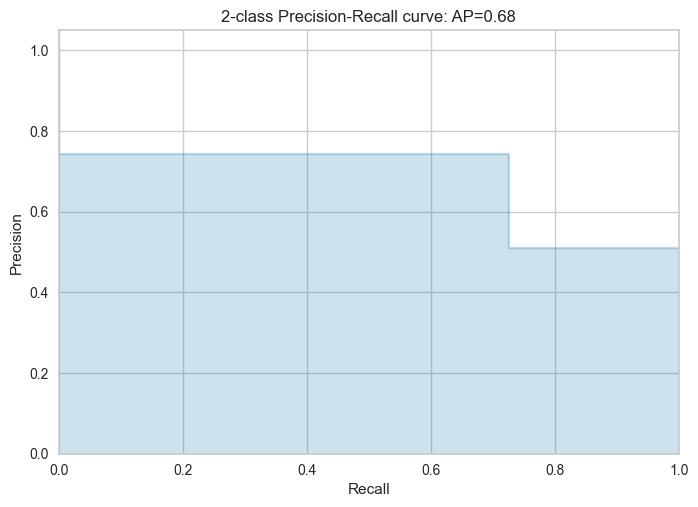

roc auc score: 0.7329276624429526



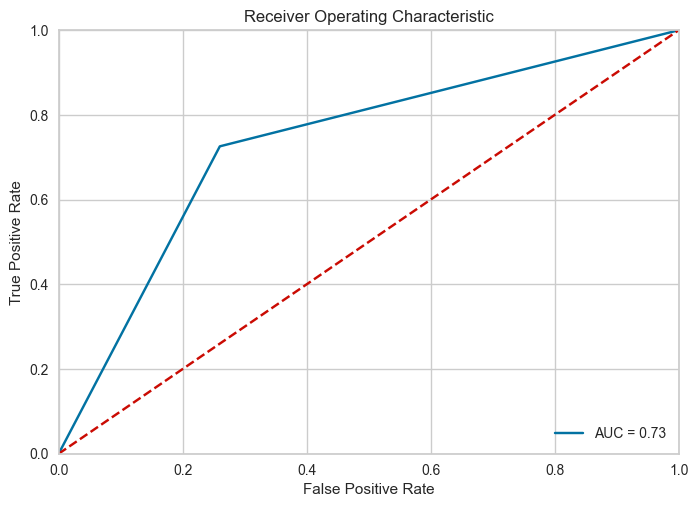

Classification Report: 
               precision    recall  f1-score   support

           0       0.72      0.74      0.73       727
           1       0.74      0.73      0.73       755

    accuracy                           0.73      1482
   macro avg       0.73      0.73      0.73      1482
weighted avg       0.73      0.73      0.73      1482


Confusion Matrix: 
 [[538 189]
 [207 548]]

End of validation Result



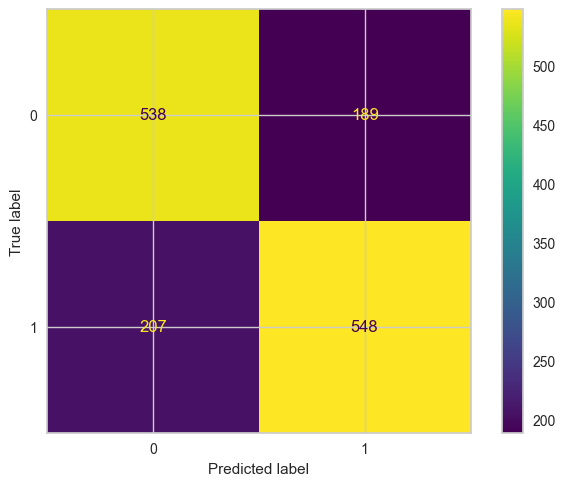

In [114]:
clf_score(best_model_log, X_train, y_train, X_val, y_val, train=False)

#### Validation Curve

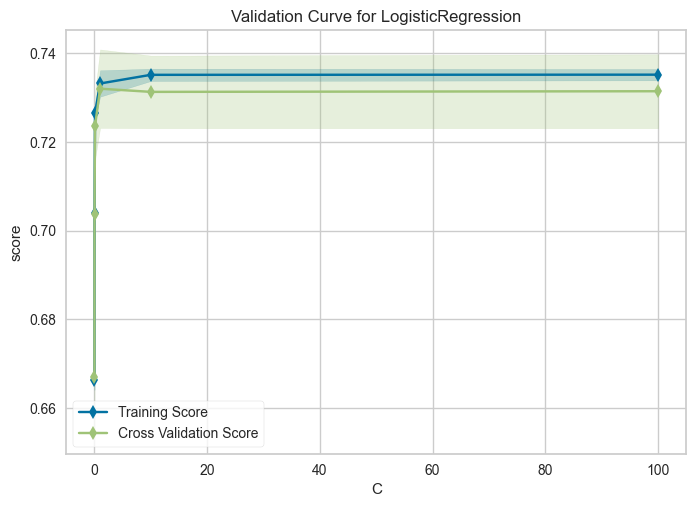

<Axes: title={'center': 'Validation Curve for LogisticRegression'}, xlabel='C', ylabel='score'>

In [115]:
from yellowbrick.model_selection import ValidationCurve

viz = ValidationCurve(
    best_model_log, 
    param_name="C",
    param_range=[0.001, 0.01, 0.1, 1, 10, 100], 
    cv=5, 
    scoring="f1_weighted",
    np_jobs=8
)

# Fit and show the visualizer
viz.fit(X_train, y_train)
viz.poof()

#### Learning Curve

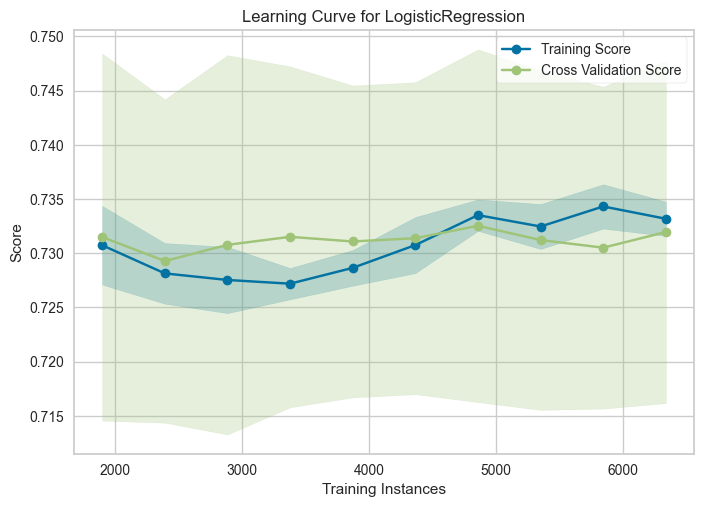

<Axes: title={'center': 'Learning Curve for LogisticRegression'}, xlabel='Training Instances', ylabel='Score'>

In [116]:
from sklearn.model_selection import StratifiedKFold
from yellowbrick.model_selection import LearningCurve

# Create the learning curve visualizer
cv = StratifiedKFold(n_splits=12)
sizes = np.linspace(0.3, 1.0, 10)

# Instantiate the classification model and visualizer
visualizer = LearningCurve(
    best_model_log, 
    cv=cv, 
    scoring='f1_weighted', 
    train_sizes=sizes, 
    n_jobs=8
)

visualizer.fit(X_train, y_train)  
visualizer.poof()

### **PCA**

In [117]:
from sklearn.preprocessing import StandardScaler

X_pca = df1.drop('blueWins', axis=1)
y_pca = df1['blueWins']
# PCA is affected by scale, scale the dataset first
# Standardizing the features
X_pca_scaled = StandardScaler().fit_transform(X_pca)

In [118]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
components = pca.fit_transform(X_pca_scaled)
print(pca.explained_variance_ratio_)

[0.18310685 0.08895565]


In [119]:
from sklearn.model_selection import train_test_split
df_vis = pd.DataFrame(data = components, columns = ['pc1', 'pc2'])
df_vis = pd.concat([df_vis, df1['blueWins']], axis = 1)
X = df_vis[['pc1', 'pc2']]
y = df_vis['blueWins']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [120]:
# refit the pca data into logistic regression
best_model_log.fit(X_train, y_train)

LogisticRegression(C=1)

In [121]:
# visualize function
from matplotlib.colors import ListedColormap
def DecisionBoundary(clf):
    X = df_vis[['pc1', 'pc2']]
    y = df_vis['blueWins']

    h = .02  # step size in the mesh

    # Create color maps
    cmap_light = ListedColormap(['#FFAAAA', '#AAAAFF'])
    cmap_bold = ListedColormap(['#FF0000', '#0000FF'])

#Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    x_min, x_max = X.iloc[:, 0].min() - 1, X.iloc[:, 0].max() + 1
    y_min, y_max = X.iloc[:, 1].min() - 1, X.iloc[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.figure(figsize=(8, 8))
    plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

    # Plot also the training points
    plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, cmap=cmap_bold)
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.show()

c:\Users\Park\anaconda3\envs\MLproduction\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


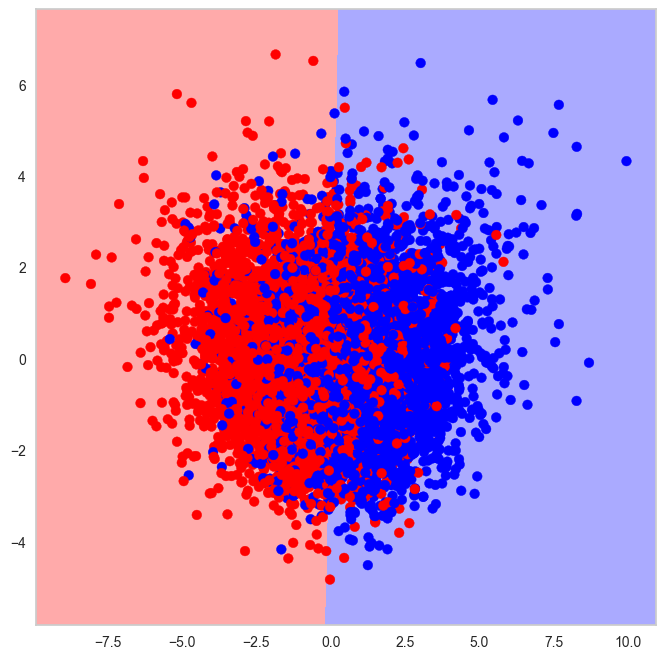

In [122]:
DecisionBoundary(best_model_log)